#Project 2 on Building a machine learning classification model using any dataset

In [108]:
# Import Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import classification_report
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.cluster import KMeans
from sklearn.ensemble import RandomForestClassifier

#Importing the Dataset

In [111]:
df= pd.read_csv('D:\ML\Project\engine_fault_detection_dataset.csv')
df.head()

<>:1: SyntaxWarning: invalid escape sequence '\M'
<>:1: SyntaxWarning: invalid escape sequence '\M'
C:\Users\user\AppData\Local\Temp\ipykernel_8496\625881928.py:1: SyntaxWarning: invalid escape sequence '\M'
  df= pd.read_csv('D:\ML\Project\engine_fault_detection_dataset.csv')


,Vibration_Amplitude,RMS_Vibration,Vibration_Frequency,Surface_Temperature,Exhaust_Temperature,Acoustic_dB,Acoustic_Frequency,Intake_Pressure,Exhaust_Pressure,Frequency_Band_Energy,Amplitude_Mean,Engine_Condition
0,3.807947,1.899522,1465.396656,106.577348,319.564816,110.834195,3733.620495,91.279833,104.544934,0.889443,0.294582,0
1,9.512072,1.697915,385.333751,85.115094,237.927110,89.671023,4417.399188,114.855139,84.358093,0.916455,0.268216,0
2,7.346740,0.921962,706.346595,145.739823,250.543690,71.727937,2369.581389,97.479227,108.393914,0.440535,0.182008,0
3,6.026719,3.055970,1333.295661,56.277414,272.268451,104.198507,1516.975785,98.518121,105.296723,0.308468,0.251674,2
4,1.644585,2.409290,974.536902,100.542770,281.461334,85.120688,1662.348214,96.787358,107.565599,0.272495,0.188897,0


In [113]:
#Information on every Column
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 12 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Vibration_Amplitude    10000 non-null  float64
 1   RMS_Vibration          10000 non-null  float64
 2   Vibration_Frequency    10000 non-null  float64
 3   Surface_Temperature    10000 non-null  float64
 4   Exhaust_Temperature    10000 non-null  float64
 5   Acoustic_dB            10000 non-null  float64
 6   Acoustic_Frequency     10000 non-null  float64
 7   Intake_Pressure        10000 non-null  float64
 8   Exhaust_Pressure       10000 non-null  float64
 9   Frequency_Band_Energy  10000 non-null  float64
 10  Amplitude_Mean         10000 non-null  float64
 11  Engine_Condition       10000 non-null  int64  
dtypes: float64(11), int64(1)
memory usage: 937.6 KB


In [115]:
df.describe()

,Vibration_Amplitude,RMS_Vibration,Vibration_Frequency,Surface_Temperature,Exhaust_Temperature,Acoustic_dB,Acoustic_Frequency,Intake_Pressure,Exhaust_Pressure,Frequency_Band_Energy,Amplitude_Mean,Engine_Condition
count,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,4.992180,2.547423,1010.099781,89.845606,398.745522,90.188675,2558.761766,104.976734,95.031300,0.545828,0.255133,0.503700
std,2.847538,1.432008,567.812039,34.679351,115.713672,17.300477,1409.523813,8.579042,8.749599,0.258961,0.141254,0.670844
min,0.100115,0.050781,20.095285,30.000664,200.006695,60.000506,101.323600,90.003900,80.003865,0.100026,0.010048,0.000000
25%,2.538656,1.307032,522.420864,59.622870,297.708889,75.417389,1344.035229,97.559952,87.314803,0.320392,0.130852,0.000000
50%,4.976033,2.554189,1014.094827,90.003629,397.486877,90.365423,2570.626283,104.976943,95.127134,0.546940,0.256507,0.000000
75%,7.426063,3.794572,1494.454231,119.653950,500.190814,105.206758,3787.099025,112.434660,102.769823,0.768050,0.377475,1.000000
max,9.997205,4.999628,1999.803934,149.974725,599.988859,119.996382,4998.480399,119.996253,109.999761,0.999978,0.499890,2.000000


In [117]:
#Counting the Target Values
df['Engine_Condition'].value_counts()

Engine_Condition
0    5963
1    3037
2    1000
Name: count, dtype: int64

In [119]:
df.sum()

Vibration_Amplitude      4.992180e+04
RMS_Vibration            2.547423e+04
Vibration_Frequency      1.010100e+07
Surface_Temperature      8.984561e+05
Exhaust_Temperature      3.987455e+06
Acoustic_dB              9.018868e+05
Acoustic_Frequency       2.558762e+07
Intake_Pressure          1.049767e+06
Exhaust_Pressure         9.503130e+05
Frequency_Band_Energy    5.458285e+03
Amplitude_Mean           2.551325e+03
Engine_Condition         5.037000e+03
dtype: float64

In [121]:
#Null value sum
df.isna().sum()

Vibration_Amplitude      0
RMS_Vibration            0
Vibration_Frequency      0
Surface_Temperature      0
Exhaust_Temperature      0
Acoustic_dB              0
Acoustic_Frequency       0
Intake_Pressure          0
Exhaust_Pressure         0
Frequency_Band_Energy    0
Amplitude_Mean           0
Engine_Condition         0
dtype: int64

In [123]:
#Dropping any duplicates
df.drop_duplicates(inplace=True)

#Starting the Scaling and Feature Selection. (Data Preprocessing)

In [128]:
scaler = StandardScaler()
X = df.drop(columns='Engine_Condition')
y = df['Engine_Condition']
X_scaled = scaler.fit_transform(X)
X_scaled

array([[-0.41590018, -0.45246481,  0.80188444, ...,  1.08737661,
         1.32696517,  0.27929302],
       [ 1.58737745, -0.59325819, -1.10035932, ..., -1.2199121 ,
         1.43127943,  0.09262934],
       [ 0.82691712, -1.13514888, -0.53498051, ...,  1.52730224,
        -0.40661997, -0.51770721],
       ...,
       [ 1.57344779, -0.69424553, -1.6759503 , ..., -1.22516898,
         0.62244041,  0.45617544],
       [-0.33611361, -0.21159379, -0.34539599, ..., -0.84115768,
         0.01418842, -1.68947386],
       [-0.96315712, -1.14859293, -0.84618813, ...,  1.46329596,
        -0.36652484, -1.53946883]])

#Data Splitting

In [130]:
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, stratify=y, random_state=42)

In [132]:
X_train

array([[ 1.37280751, -1.65263838, -0.7827744 , ...,  0.14359697,
         0.1072943 , -1.45519093],
       [-1.26501811,  1.44355101,  0.246634  , ...,  0.28962056,
         0.81542575,  1.45929257],
       [-1.28019543,  1.58882668, -1.26713214, ...,  0.20789915,
        -0.26307126,  0.49502361],
       ...,
       [-1.29995872, -0.56339393, -1.66400505, ..., -0.06740015,
        -0.76785844,  1.29330333],
       [ 0.78576332,  0.74995555,  0.30099137, ..., -0.18856933,
        -1.63067994,  0.95458925],
       [-0.21585284,  0.30808447,  1.14477792, ...,  1.52830918,
         1.45584154, -0.81339671]])

In [134]:
X_test

array([[ 0.76317354, -0.42401164, -1.06691048, ..., -1.64835433,
         0.33568834, -0.81622959],
       [ 0.00898376, -1.07936277,  0.1706387 , ...,  1.66957602,
        -0.57979799, -0.00852216],
       [ 1.31010923,  0.0342801 , -1.01736473, ...,  1.6791741 ,
         0.29571614, -1.07370447],
       ...,
       [-0.24835539, -1.13197891, -0.07494673, ..., -1.18643567,
        -1.61023634, -1.17215998],
       [ 1.66084699,  0.45668943,  0.71989001, ..., -0.41012257,
        -0.37185606, -0.41119483],
       [-0.66387108,  0.67292334,  1.5314653 , ..., -0.34268668,
        -0.54356159,  0.76532254]])

In [136]:
y_train

5497    0
5724    2
4066    0
6743    0
9525    0
       ..
9364    1
9367    1
8140    1
4560    0
1841    0
Name: Engine_Condition, Length: 8000, dtype: int64

In [138]:
y_test

6036    0
5819    0
7668    1
4961    1
7763    2
       ..
5763    0
7332    0
3046    1
5264    0
5333    1
Name: Engine_Condition, Length: 2000, dtype: int64

#Model Building

#Logistics Regression and Accuracy Check

In [140]:
lr = LogisticRegression(max_iter=500, class_weight='balanced')
lr.fit(X_train, y_train)
lr_score = lr.score(X_test, y_test)
print(lr_score)
y_pred_lr = lr.predict(X_test)
acc_lr = accuracy_score(y_test, y_pred_lr)
print(acc_lr)

0.322
0.322


#Confusion Matrix with Logistics Regression

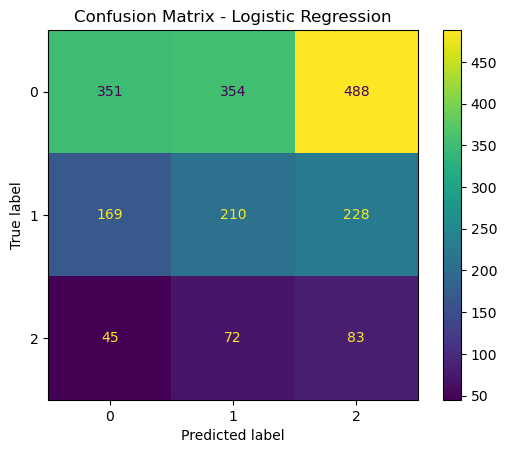

In [142]:
cm_lr = confusion_matrix(y_test, y_pred_lr)
disp_cm_lr = ConfusionMatrixDisplay(cm_lr)
disp_cm_lr.plot()
plt.title('Confusion Matrix - Logistic Regression')
plt.show()

#Classification Report

In [144]:
cr_lr = classification_report(y_test,y_pred_lr)
print(cr_lr)

              precision    recall  f1-score   support

           0       0.62      0.29      0.40      1193
           1       0.33      0.35      0.34       607
           2       0.10      0.41      0.17       200

    accuracy                           0.32      2000
   macro avg       0.35      0.35      0.30      2000
weighted avg       0.48      0.32      0.36      2000



#KNeighbours Classifier
#Accuracy Check
#Confusion Matrix with KNeighbours Classifier
#Classification Report

In [146]:
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train, y_train)
knn_score = knn.score(X_test, y_test)
print(knn_score)
y_pred_knn = knn.predict(X_test)
acc_knn = accuracy_score(y_test, y_pred_knn)
print(acc_knn)

0.53
0.53


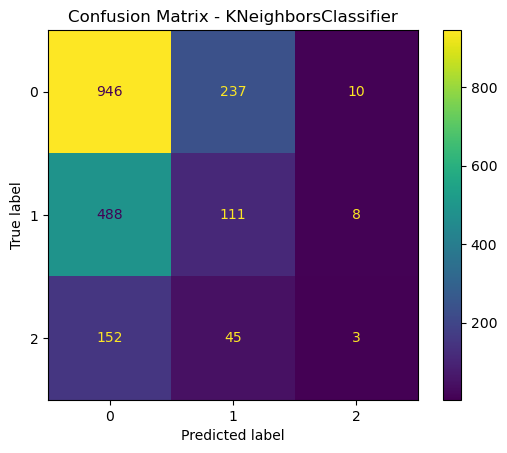

In [148]:
cm_knn = confusion_matrix(y_test, y_pred_knn)
disp_cm_knn = ConfusionMatrixDisplay(cm_knn)
disp_cm_knn.plot()
plt.title('Confusion Matrix - KNeighborsClassifier')
plt.show()

In [150]:
cr_knn = classification_report(y_test,y_pred_knn)
print(cr_knn)

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      1193
           1       0.28      0.18      0.22       607
           2       0.14      0.01      0.03       200

    accuracy                           0.53      2000
   macro avg       0.34      0.33      0.31      2000
weighted avg       0.46      0.53      0.48      2000



#Support Vector Machine
#Accuracy Check
#Confusion Matrix with Support Vector Machine
#Classification Report

In [152]:
svm = SVC(C=10, kernel = 'rbf', gamma = 'scale')
svm.fit(X_train, y_train)
svm_score = svm.score(X_test, y_test)
print(svm_score)

0.559


In [154]:
y_pred_svm = svm.predict(X_test)
acc_svm = accuracy_score(y_test, y_pred_svm)
print(acc_svm)

0.559


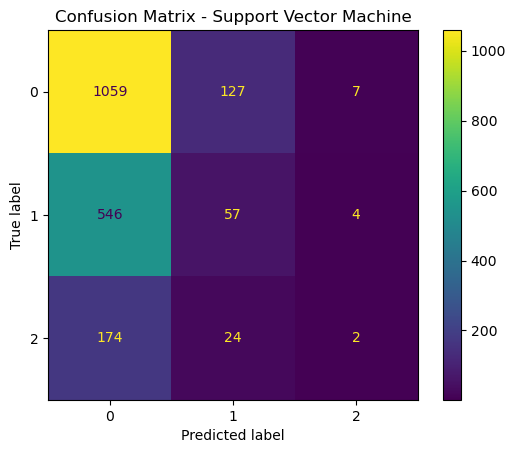

In [156]:
cm_svm = confusion_matrix(y_test, y_pred_svm)
disp_cm_svm = ConfusionMatrixDisplay(cm_svm)
disp_cm_svm.plot()
plt.title('Confusion Matrix - Support Vector Machine')
plt.show()

In [158]:
cr_svm = classification_report(y_test,y_pred_svm)
print(cr_svm)

              precision    recall  f1-score   support

           0       0.60      0.89      0.71      1193
           1       0.27      0.09      0.14       607
           2       0.15      0.01      0.02       200

    accuracy                           0.56      2000
   macro avg       0.34      0.33      0.29      2000
weighted avg       0.45      0.56      0.47      2000



#KMeans Clustering
#Accuracy Check
#Confusion Matrix with KMeans Clustering
#Classification Report

In [160]:
kmc = KMeans(n_clusters = 2, random_state= 42)
kmc.fit(X_train, y_train)
kmc_score = kmc.score(X_test, y_train)
print(kmc_score)
y_pred_kmc = kmc.predict(X_test)
acc_kmc = accuracy_score(y_test, y_pred_kmc)
print(acc_kmc)

-20652.67778286213
0.467


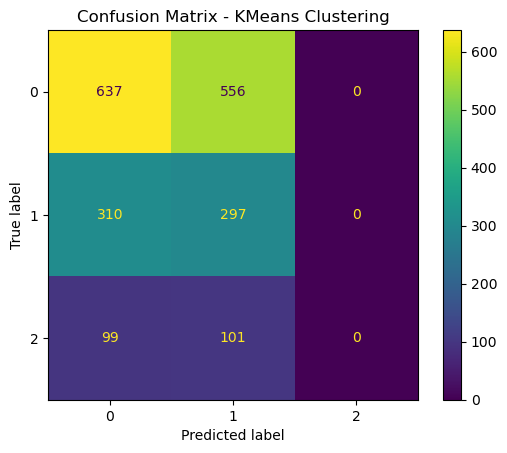

In [162]:
cm_kmc = confusion_matrix(y_test, y_pred_kmc)
disp_cm_kmc = ConfusionMatrixDisplay(cm_kmc)
disp_cm_kmc.plot()
plt.title('Confusion Matrix - KMeans Clustering')
plt.show()

In [164]:
cr_kmc = classification_report(y_test,y_pred_kmc)
print(cr_kmc)

              precision    recall  f1-score   support

           0       0.61      0.53      0.57      1193
           1       0.31      0.49      0.38       607
           2       0.00      0.00      0.00       200

    accuracy                           0.47      2000
   macro avg       0.31      0.34      0.32      2000
weighted avg       0.46      0.47      0.45      2000



C:\Users\user\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\user\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\user\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


#Random Forest
#Accuracy Check
#Confusion Matrix with Random Forest
#Classification Report

In [166]:
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)
y_pred_rf = rf.predict(X_test)
rf_score = rf.score(X_test, y_test)
print(rf_score)
acc_rf = accuracy_score(y_test, y_pred_rf)
print(acc_rf)

0.592
0.592


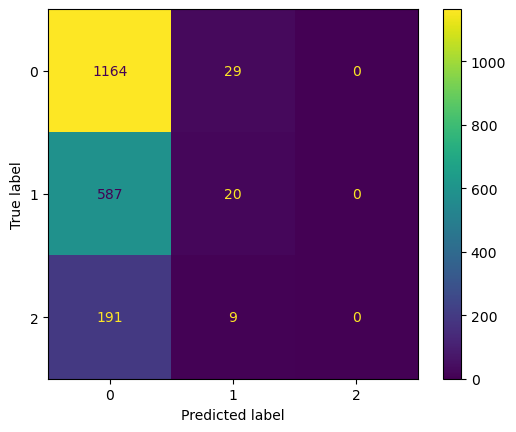

In [167]:
cm_rf = confusion_matrix(y_test, y_pred_rf)
disp_cm_rf = ConfusionMatrixDisplay(confusion_matrix=cm_rf)
disp_cm_rf.plot()
plt.show()

In [170]:
cr_rf = classification_report(y_test, y_pred_rf)
print(cr_rf)

              precision    recall  f1-score   support

           0       0.60      0.98      0.74      1193
           1       0.34      0.03      0.06       607
           2       0.00      0.00      0.00       200

    accuracy                           0.59      2000
   macro avg       0.31      0.34      0.27      2000
weighted avg       0.46      0.59      0.46      2000



C:\Users\user\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\user\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\user\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


#Data Visualization with Pair Plot, Count Plot and Correlation

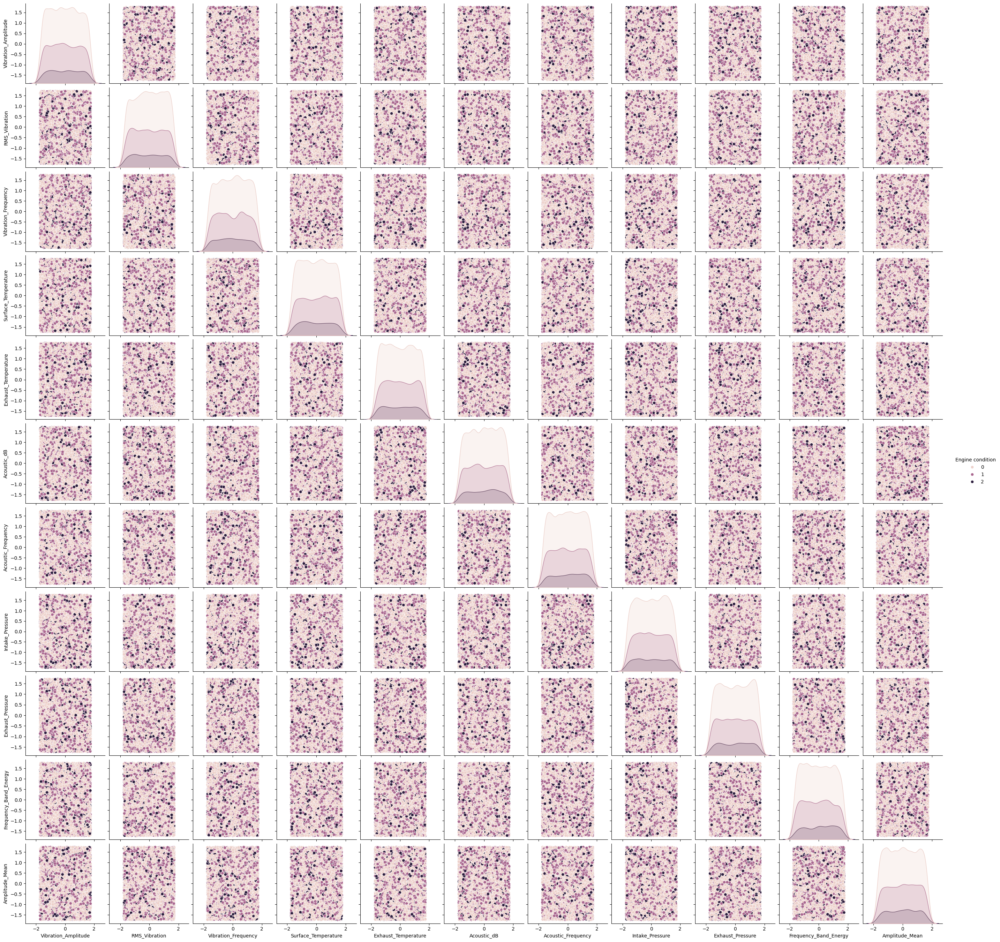

In [172]:
X_df = pd.DataFrame(X_scaled, columns=X.columns)
X_df['Engine condition'] = y.reset_index(drop=True)
sns.pairplot(X_df, hue='Engine condition')
plt.show()

In [180]:
corr = df.corr()
corr

,Vibration_Amplitude,RMS_Vibration,Vibration_Frequency,Surface_Temperature,Exhaust_Temperature,Acoustic_dB,Acoustic_Frequency,Intake_Pressure,Exhaust_Pressure,Frequency_Band_Energy,Amplitude_Mean,Engine_Condition
Vibration_Amplitude,1.000000,-0.005125,-0.009346,0.006309,-0.007358,-0.016801,0.005722,0.007848,-0.006429,-0.016468,0.012989,-0.001205
RMS_Vibration,-0.005125,1.000000,-0.024219,-0.021281,-0.011014,0.005390,-0.009768,0.000446,-0.004253,0.009779,-0.010941,-0.021542
Vibration_Frequency,-0.009346,-0.024219,1.000000,-0.004196,-0.007431,0.002065,-0.009397,0.000582,0.025749,-0.004607,-0.000569,-0.018430
Surface_Temperature,0.006309,-0.021281,-0.004196,1.000000,0.011476,0.007498,-0.007165,0.006983,-0.018921,0.011890,-0.013871,0.006764
Exhaust_Temperature,-0.007358,-0.011014,-0.007431,0.011476,1.000000,-0.004298,0.005246,-0.014495,-0.009756,-0.004331,-0.005762,0.001470
Acoustic_dB,-0.016801,0.005390,0.002065,0.007498,-0.004298,1.000000,-0.008686,0.004814,0.010600,-0.013287,0.001682,0.001212
Acoustic_Frequency,0.005722,-0.009768,-0.009397,-0.007165,0.005246,-0.008686,1.000000,-0.022645,0.019373,0.006532,0.001701,0.009639
Intake_Pressure,0.007848,0.000446,0.000582,0.006983,-0.014495,0.004814,-0.022645,1.000000,-0.005241,-0.009885,0.007406,-0.007164
Exhaust_Pressure,-0.006429,-0.004253,0.025749,-0.018921,-0.009756,0.010600,0.019373,-0.005241,1.000000,0.004424,-0.005410,-0.012027
Frequency_Band_Energy,-0.016468,0.009779,-0.004607,0.011890,-0.004331,-0.013287,0.006532,-0.009885,0.004424,1.000000,-0.012989,0.017512


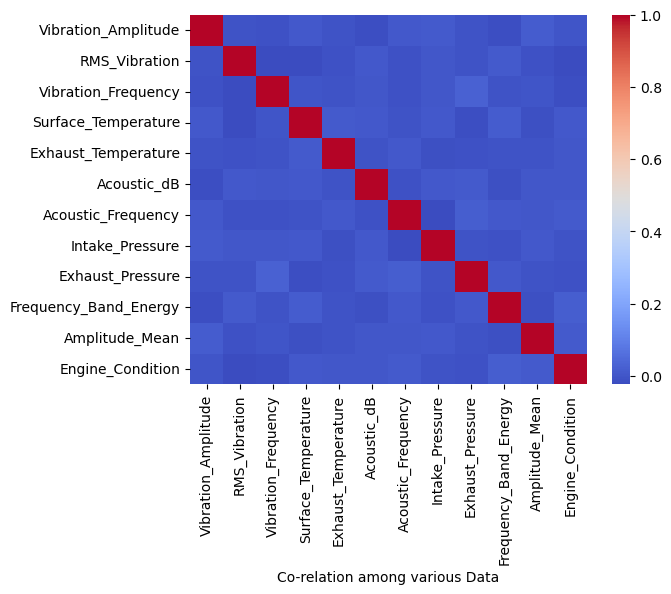

In [182]:
sns.heatmap(corr, cmap = 'coolwarm')
plt.xlabel('Co-relation among various Data')
plt.show()

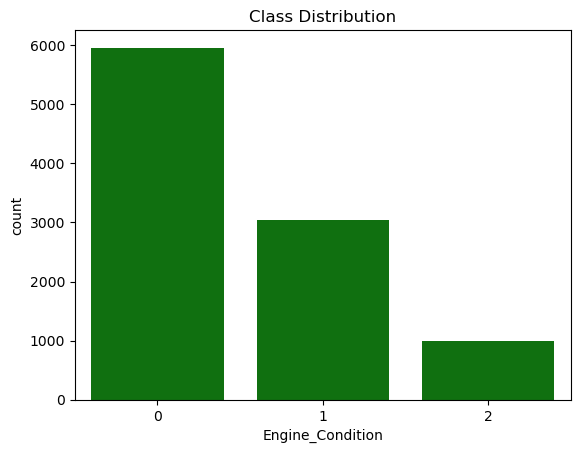

In [184]:
sns.countplot(x = df['Engine_Condition'], color = 'green')
plt.title('Class Distribution')
plt.show()

#Checking the Accuracy if it's over 85% or not

In [186]:
acc = [acc_lr, acc_knn, acc_svm, acc_kmc, acc_rf]
acc

[0.322, 0.53, 0.559, 0.467, 0.592]

In [188]:
if any(score>= 0.85 for score in acc):
    print('The Target has been Achieved')
else:
    print('The Target has NOT been Achieved. Further Tuning needed.')

The Target has NOT been Achieved. Further Tuning needed.
